In [83]:
import os
os.chdir('/Users/austen/Car-ND/submission_P4_CW/CarND-Advanced-Lane-Lines-master')
cwd = os.getcwd()

In [85]:
### Step-1 Camera calibration and treatment of distortion based on the given chess board images
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import glob

#prepar to read an images 

images = glob.glob('./camera_cal/calibration*.jpg')

nx = 9
ny = 6
print('Calibration images used: ', len(images))
objPoints = []
imgPoints = []

objp = np.zeros((ny*nx, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
# opencv's tutorial used the following criteria as used in corners2
#http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

for image_name in images:
    ### define the object corners determined by the 9*6 grid
    img_input = mpimg.imread(image_name)
    gray = cv2.cvtColor(img_input, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret == True:
        imgPoints.append(corners)
        #corners2 = cv2.cornerSubPix(gray, corners, (11,11),(-1,-1),criteria)
        #imgPoints.append(corners2)
        objPoints.append(objp)


Calibration images used:  17


In [84]:
def compute_camera_calibration(objpoints, imgpoints, img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return mtx, dist
def cal_undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [4]:
def oneChessBoard_cali(chessboard_img, nx, ny):
    img_input = chessboard_img
    objPoints = []
    imgPoints = []

    ### define the object corners determined by the 9*6 grid
    objp = np.zeros((ny*nx, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    gray = cv2.cvtColor(img_input, cv2.COLOR_RGB2GRAY)
    ### 
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    #print(ret)
    if ret == True:
        imgPoints.append(corners)
        objPoints.append(objp)
    return objPoints, imgPoints


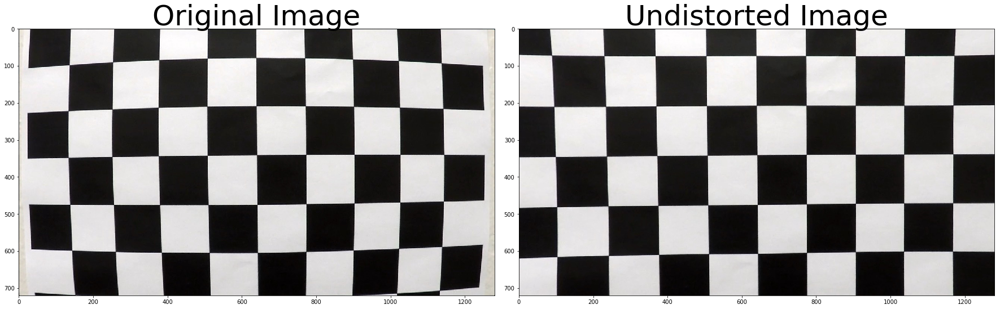

In [90]:
def showOriginAndUndistort(img_RGB, objpoints, imgpoints):
    
    mtx, dist = compute_camera_calibration(objpoints, imgpoints, img_RGB)
    
    undistorted = cal_undistort(img_RGB, mtx, dist)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_RGB)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return mtx, dist
img = mpimg.imread(cwd + '/calibration1.jpg')
mtx_chess, dist_chess = showOriginAndUndistort(img, objPoints, imgPoints)

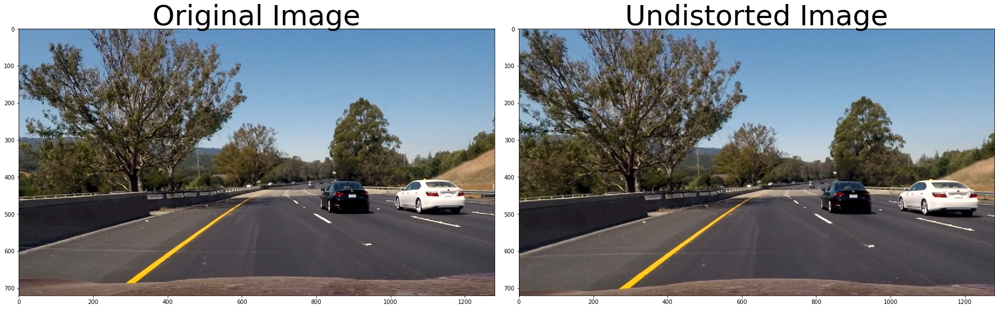

In [94]:
### Now test an image to see the undistorted 
# Choose an image for illustrating the pipeline
img_test = mpimg.imread(cwd + '/test_images/test6.jpg')
mtx_lane, dist_lane = showOriginAndUndistort(img_test, objPoints, imgPoints)

In [92]:
mtx_lane

array([[  1.15396093e+03,   0.00000000e+00,   6.69705357e+02],
       [  0.00000000e+00,   1.14802496e+03,   3.85656234e+02],
       [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00]])

In [93]:
mtx_chess

array([[  1.15396093e+03,   0.00000000e+00,   6.69705357e+02],
       [  0.00000000e+00,   1.14802496e+03,   3.85656234e+02],
       [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00]])

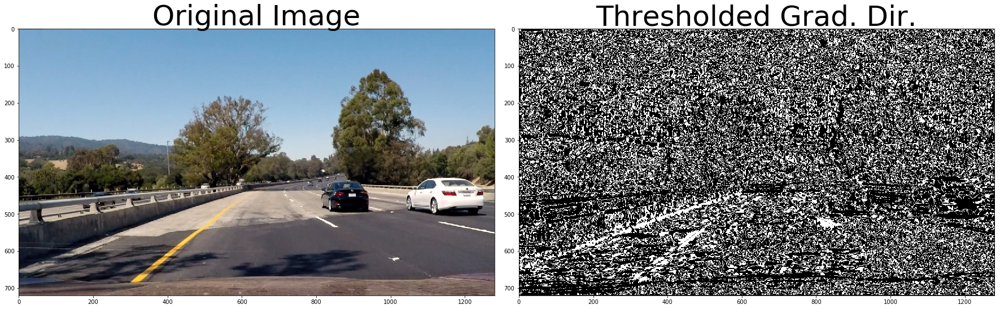

In [7]:
### Step-1 Camera calibration and treatment of distortion based on the given chess board images
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Read in an image
image = mpimg.imread(cwd + '/test_images/test4.jpg')

# ** I have used the code from the course quiz as a starting point **
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=9, thresh=(0.7, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelX = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    sobelX_abs = np.absolute(sobelX)
    sobelY_abs = np.absolute(sobelY)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dirGrad = np.arctan2(sobelY_abs, sobelX_abs)
    # 5) Create a binary mask where direction thresholds are met
    thresh_low = thresh[0]
    thresh_high = thresh[1]
    binary_output = np.zeros_like(dirGrad)
    binary_output[(dirGrad >= thresh_low) & (dirGrad <= thresh_high)] = 1
    # 6) Return this mask as your binary_output image

    return binary_output
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.8, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

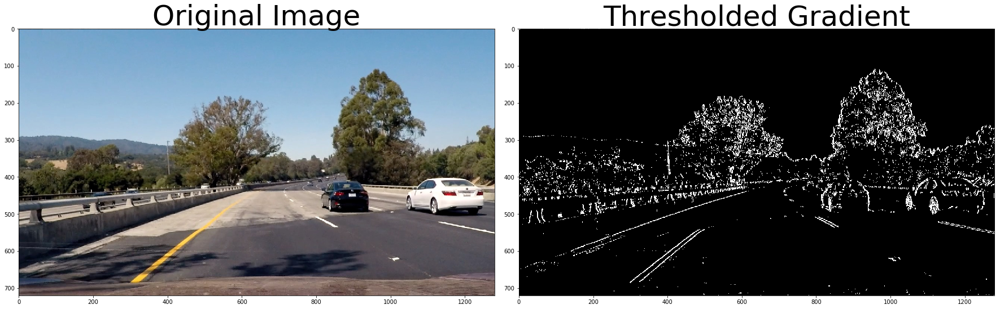

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Read in an image and grayscale it
image = mpimg.imread(cwd + '/test_images/test4.jpg')
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelX = cv2.Sobel(gray, cv2.CV_64F,1,0)
    sobelY = cv2.Sobel(gray, cv2.CV_64F,0,1)
    
    if orient == 'x':
        sobel = sobelX    
    elif orient == 'y':
        sobel = sobelY
    else:
        return
    # 3) Take the absolute value of the derivative or gradient
    sobel_abs = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled = 255.0 * (sobel_abs/np.amax(sobel_abs))
    scaled.astype(np.uint8)
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled >= thresh_min) & (scaled <= thresh_max)] = 1      
    
    # 6) Return this mask as your binary_output image
     # Remove this line
    return binary_output
    
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=25, thresh_max=200)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

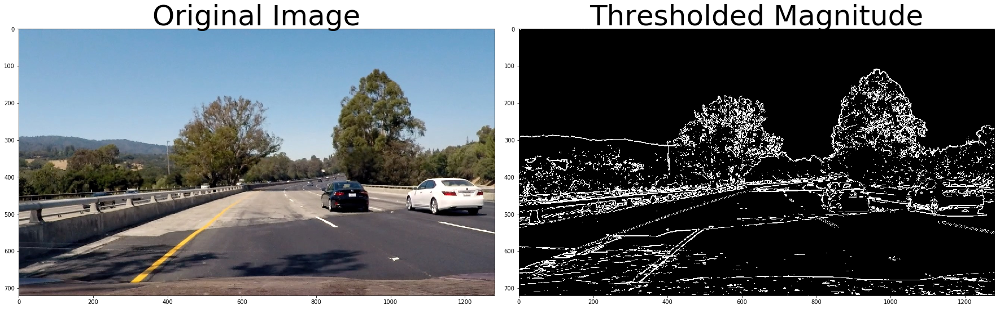

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Read in an image
image = mpimg.imread(cwd + '/test_images/test4.jpg')

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelX = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize = sobel_kernel)
    sobel_magnitude = np.sqrt(np.square(sobelX) + np.square(sobelY))
    scaled = 255.0 * (sobel_magnitude/np.amax(sobel_magnitude))
    scaled.astype(np.uint8)
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < mag_thresh
    thresh_min = mag_thresh[0]
    thresh_max = mag_thresh[1]
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled >= thresh_min) & (scaled <= thresh_max)] = 1      
    
    # 6) Return this mask as your binary_output image

    return binary_output
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

### Three types of Sobel based thresholding: gradient, gradient magnitude,gradient direction

## one-direction 'x' or 'y' sobel threshold
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelX = cv2.Sobel(gray, cv2.CV_64F,1,0)
    sobelY = cv2.Sobel(gray, cv2.CV_64F,0,1)
    
    if orient == 'x':
        sobel = sobelX    
    elif orient == 'y':
        sobel = sobelY
    else:
        return
    # 3) Take the absolute value of the derivative or gradient
    sobel_abs = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled = 255.0 * (sobel_abs/np.amax(sobel_abs))
    scaled.astype(np.uint8)
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled >= thresh_min) & (scaled <= thresh_max)] = 1      
    # 6) Return this mask as your binary_output image
     # Remove this line
    return binary_output

## magnitude based thresholding
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):

    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelX = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize = sobel_kernel)
    sobel_magnitude = np.sqrt(np.square(sobelX) + np.square(sobelY))
    scaled = 255.0 * (sobel_magnitude/np.amax(sobel_magnitude))
    scaled.astype(np.uint8)
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < mag_thresh
    thresh_min = mag_thresh[0]
    thresh_max = mag_thresh[1]
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled >= thresh_min) & (scaled <= thresh_max)] = 1      
    # 6) Return this mask as your binary_output image

    return binary_output

## direction arctan based thresholding
def dir_threshold(img, sobel_kernel=9, thresh=(0.7, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelX = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    sobelX_abs = np.absolute(sobelX)
    sobelY_abs = np.absolute(sobelY)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dirGrad = np.arctan2(sobelY_abs, sobelX_abs)
    # 5) Create a binary mask where direction thresholds are met
    thresh_low = thresh[0]
    thresh_high = thresh[1]
    binary_output = np.zeros_like(dirGrad)
    binary_output[(dirGrad >= thresh_low) & (dirGrad <= thresh_high)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

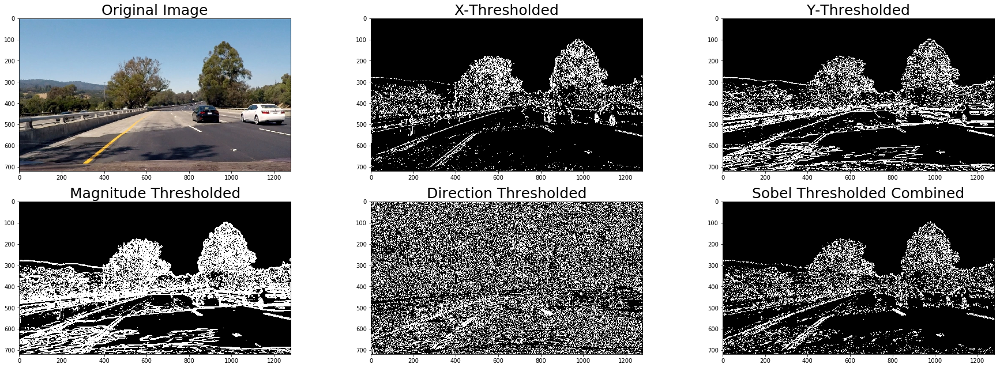

In [95]:
# Read in an image and see the effect of all three Sobel based thresholding 
image = mpimg.imread(cwd + '/test_images/test4.jpg')
# undistort image
image_undistort = cal_undistort(image, mtx_lane, dist_lane)

# Run the sobel functions on the undistorted image!

gradX_binary = abs_sobel_thresh(image_undistort, orient='x', thresh_min=12, thresh_max=220)
gradY_binary = abs_sobel_thresh(image_undistort, orient='y', thresh_min=12, thresh_max=220)
magnitude_binary = mag_thresh(image_undistort, sobel_kernel=9, mag_thresh=(12, 220))
dir_binary = dir_threshold(image_undistort, sobel_kernel=9, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
combined[((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, axes = plt.subplots(2, 3, figsize=(24, 9))
#f.tight_layout()
axes[0,0].imshow(image)
axes[0,0].set_title('Original Image', fontsize=25)
axes[0,1].imshow(gradX_binary, cmap='gray')
axes[0,1].set_title('X-Thresholded', fontsize=25)
axes[0,2].imshow(gradY_binary, cmap='gray')
axes[0,2].set_title('Y-Thresholded', fontsize=25)
axes[1,0].imshow(magnitude_binary, cmap='gray')
axes[1,0].set_title('Magnitude Thresholded', fontsize=25)
axes[1,1].imshow(dir_binary, cmap='gray')
axes[1,1].set_title('Direction Thresholded', fontsize=25)
axes[1,2].imshow(combined, cmap='gray')
axes[1,2].set_title('Sobel Thresholded Combined', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0)

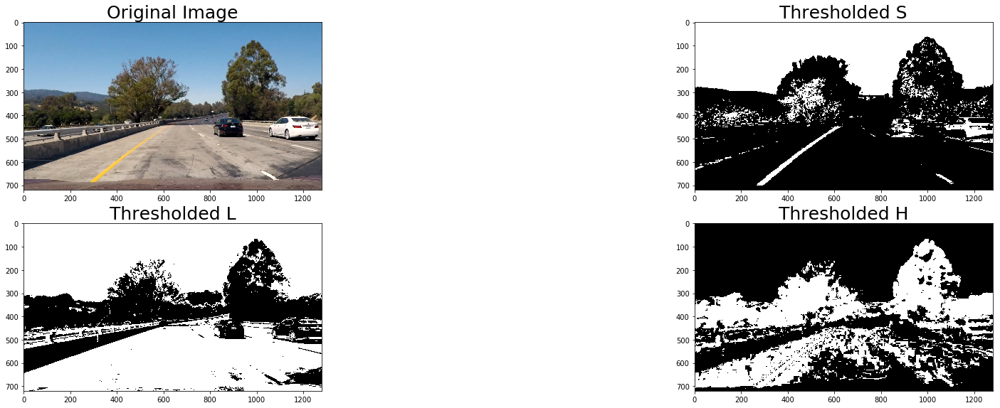

In [96]:
### Introduce the HLS , RGB and LAB thresholding
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2


# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, channel = 's', thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    hls_H = hls_img[:,:,0]
    hls_L = hls_img[:,:,1]
    hls_S = hls_img[:,:,2]
    if channel == 's':
        # 2) Apply a threshold to the S channel
        binary_output = np.zeros_like(hls_S)
        # 3) Return a binary image of threshold result
        binary_output[(hls_S > thresh[0]) & (hls_S <= thresh[1])] = 1
    elif channel == 'l':
        #l_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(hls_L)
        binary_output[(hls_L >= thresh[0]) & (hls_L <= thresh[1])] = 1
    elif channel == 'h':
        #h_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(hls_H)
        binary_output[(hls_H >= thresh[0]) & (hls_H <= thresh[1])] = 1
        
    return binary_output

def luv_select(img, channel = 'l', thresh=(0, 255)):
    # 1) Convert to HLS color space
    luv_img = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    
    luv_L = luv_img[:,:,0]
    luv_U = luv_img[:,:,1]
    luv_V = luv_img[:,:,2]
    if channel == 'l':
        # 2) Apply a threshold to the S channel
        binary_output = np.zeros_like(luv_L)
        # 3) Return a binary image of threshold result
        binary_output[(luv_L > thresh[0]) & (luv_L <= thresh[1])] = 1
    elif channel == 'u':
        #l_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(luv_U)
        binary_output[(luv_U >= thresh[0]) & (luv_U <= thresh[1])] = 1
    elif channel == 'v':
        #h_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(luv_V)
        binary_output[(luv_V >= thresh[0]) & (luv_V <= thresh[1])] = 1
        
    return binary_output

def rgb_select(RGB_img, channel = 'r', thresh=(0, 255)):
    # the input image must be in RGB
    rgb_R = RGB_img[:,:,0]
    rgb_G = RGB_img[:,:,1]
    rgb_B = RGB_img[:,:,2]
    if channel == 'r':
        # 2) Apply a threshold to the S channel
        binary_output = np.zeros_like(rgb_R)
        # 3) Return a binary image of threshold result
        binary_output[(rgb_R > thresh[0]) & (rgb_R <= thresh[1])] = 1
    elif channel == 'g':
        #l_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(rgb_G)
        binary_output[(rgb_G >= thresh[0]) & (rgb_G <= thresh[1])] = 1
    elif channel == 'b':
        #h_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(hls_B)
        binary_output[(rgb_B >= thresh[0]) & (rgb_B <= thresh[1])] = 1
        
    return binary_output

def lab_select(img, channel = 'l', thresh=(0, 255)):

    # 1) Convert to LAB color space
    lab_img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    
    lab_L = lab_img[:,:,0]
    lab_A = lab_img[:,:,1]
    lab_B = lab_img[:,:,2]
    if channel == 'l':
        # 2) Apply a threshold to the S channel
        binary_output = np.zeros_like(lab_L)
        # 3) Return a binary image of threshold result
        binary_output[(lab_L >= thresh[0]) & (lab_L <= thresh[1])] = 1
    elif channel == 'a':
        #l_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(lab_A)
        binary_output[(lab_A >= thresh[0]) & (lab_A <= thresh[1])] = 1
    elif channel == 'b':
        #h_thresh = thresh  ## (100, 200)
        binary_output = np.zeros_like(lab_B)
        binary_output[(lab_B >= thresh[0]) & (lab_B <= thresh[1])] = 1  
    return binary_output

# Read in an image, you can also try test1.jpg or test4.jpg
image = mpimg.imread(cwd + '/test_images/test1.jpg')
# undistort image
image_undistort = cal_undistort(image, mtx_lane, dist_lane)

S_binary = hls_select(image_undistort, channel = 's', thresh=(90, 255))
L_binary = hls_select(image_undistort, channel = 'l', thresh=(90, 200))
H_binary = hls_select(image_undistort, channel = 'h', thresh=(15, 100))

# Plot the result
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 9))
#f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(S_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=25)
ax3.imshow(L_binary, cmap='gray')
ax3.set_title('Thresholded L', fontsize=25)
ax4.imshow(H_binary, cmap='gray')
ax4.set_title('Thresholded H', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.1)

True

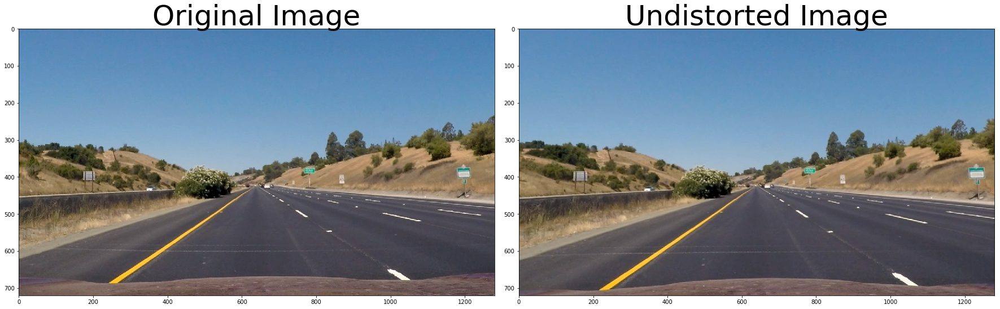

In [100]:
#### Step-3 perspective warping 
## Load a straight lane line image and make sure it is a straight line ...
image_straight = mpimg.imread(cwd + '/test_images/straight_lines1.jpg')
showOriginAndUndistort(image_straight, objPoints, imgPoints)
image_straight_undistort = cal_undistort(image_straight, mtx_lane, dist_lane)
cv2.imwrite(cwd + '/test_images/straight_lines1_undistort.jpg', cv2.cvtColor(image_straight_undistort, cv2.COLOR_RGB2BGR))


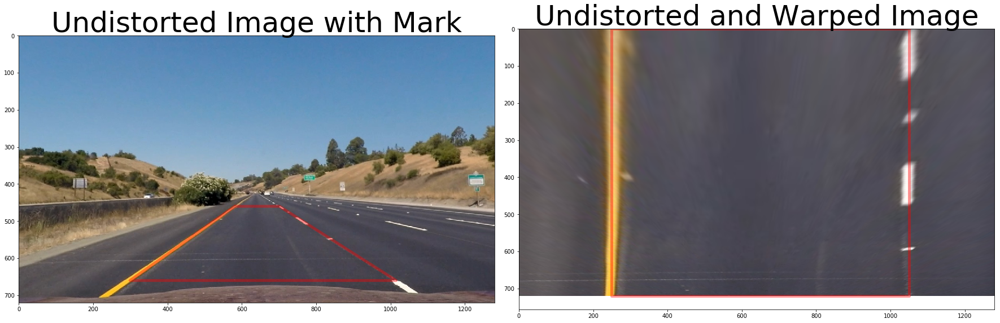

In [101]:

# Read in an image undistorted with straight lines
image_perspective = image_straight_undistort

height, width = image_straight_undistort.shape[:2]

# Manually pick up the 4 points of a trapozoid from the undistorted
# src = np.float32([[581, height-260],[701, height-260],[299, height-60],[1015, height-60]])
src = np.float32([[581, 460],[701, 460],[299, 660],[1015, 660]])
# define the rectangular 
dst = np.float32([[250,0],[1050,0],[250,height],[1050, height]])
# obtain M from the four anchors above
M = cv2.getPerspectiveTransform(src, dst) 
## warped image
warped = cv2.warpPerspective(image_perspective, M, (width, height)) 

#top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_perspective)
x = [src[0][0],src[1][0],src[3][0],src[2][0],src[0][0]]
y = [src[0][1],src[1][1],src[3][1],src[2][1],src[0][1]]
ax1.plot(x, y, color='red', alpha=0.4, linewidth=5, solid_capstyle='round', zorder=2)
ax1.set_title('Undistorted Image with Mark', fontsize=50)
ax2.imshow(warped)
x = [dst[0][0],dst[1][0],dst[3][0],dst[2][0],dst[0][0]]
y = [dst[0][1],dst[1][1],dst[3][1],dst[2][1],dst[0][1]]
ax2.plot(x, y, color='red', alpha=0.4, linewidth=5, solid_capstyle='round', zorder=2)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


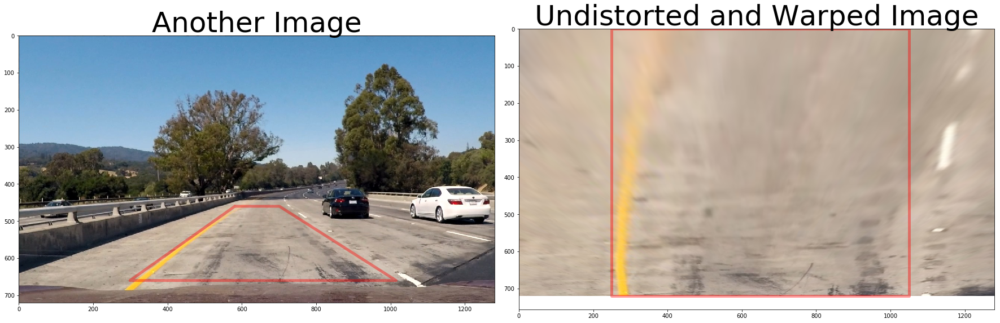

In [102]:

def warp_color(image, objPoints, imgPoints, src, dst):
    # Pass in original image into this function
    # 1) Undistort using objPoints and imgPoints
    image_undistort = cal_undistort(image, mtx_lane, dist_lane)
    # 2) do perspective transform based on given src and dst
    height, width = image_straight_undistort.shape[:2]
    M = cv2.getPerspectiveTransform(src, dst) 
    warped = cv2.warpPerspective(image_undistort, M, (width, height)) 

    return warped, M

# Read in a different image for testing
image = mpimg.imread(cwd + '/test_images/test1.jpg')
top_down, perspective_M = warp_color(image, objPoints, imgPoints, src, dst)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
x = [src[0][0],src[1][0],src[3][0],src[2][0],src[0][0]]
y = [src[0][1],src[1][1],src[3][1],src[2][1],src[0][1]]
ax1.plot(x, y, color='red', alpha=0.4, linewidth=5, solid_capstyle='round', zorder=2)
ax1.set_title('Another Image', fontsize=50)
ax2.imshow(top_down)
x = [dst[0][0],dst[1][0],dst[3][0],dst[2][0],dst[0][0]]
y = [dst[0][1],dst[1][1],dst[3][1],dst[2][1],dst[0][1]]
ax2.plot(x, y, color='red', alpha=0.4, linewidth=5, solid_capstyle='round', zorder=2)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


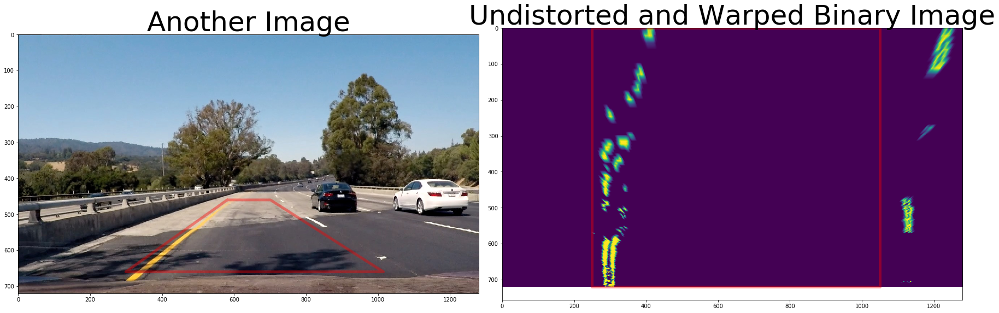

In [103]:
## the warp function is for illustration. While the warp_binary is placed on sobel+color gradient binary figures
def warp_binary(binary, objpoints, imgpoints, src, dst):
    # Pass in original image into this function
    # 1) Undistort using objPoints and imgPoints
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, binary.shape[::-1], None, None)
    image_undistort = cv2.undistort(binary, mtx, dist, None, mtx)
    # 2) do perspective transform based on given src and dst
    height, width = binary.shape[:2]
    M = cv2.getPerspectiveTransform(src, dst) 
    M_rev = cv2.getPerspectiveTransform(dst, src) 
    warped = cv2.warpPerspective(image_undistort, M, (width, height)) 

    return warped, M, M_rev


# Read in a different image for testing
image = mpimg.imread(cwd + '/test_images/test4.jpg')

# undistort image
image_undistort = cal_undistort(image, mtx_lane, dist_lane)

# Run the functions!
gradX_binary = abs_sobel_thresh(image_undistort, orient='x', thresh_min=12, thresh_max=200)
gradY_binary = abs_sobel_thresh(image_undistort, orient='y', thresh_min=12, thresh_max=200)
magnitude_binary = mag_thresh(image_undistort, sobel_kernel=9, mag_thresh=(12, 200))
dir_binary = dir_threshold(image_undistort, sobel_kernel=9, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
#combined[((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) & (dir_binary == 1))] = 1
### ** the above needs to be functionalized ** ###

S_binary = hls_select(image_undistort, channel = 's', thresh=(90, 255))
### Following the suggestion of reviewer, add R-channel and test LAB-channels
R_binary = rgb_select(image_undistort, channel = 'r', thresh=(90, 255))
combined[(((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) 
            & (dir_binary == 1))) & (S_binary == 1) & (R_binary == 1)] = 1 

top_down, perspective_M, M_rev = warp_binary(combined, objPoints, imgPoints, src, dst)

def demoWarpBinary (image, top_down, src, dst):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    x = [src[0][0],src[1][0],src[3][0],src[2][0],src[0][0]]
    y = [src[0][1],src[1][1],src[3][1],src[2][1],src[0][1]]
    ax1.plot(x, y, color='red', alpha=0.4, linewidth=5, solid_capstyle='round', zorder=2)
    ax1.set_title('Another Image', fontsize=50)
    ax2.imshow(top_down)
    x = [dst[0][0],dst[1][0],dst[3][0],dst[2][0],dst[0][0]]
    y = [dst[0][1],dst[1][1],dst[3][1],dst[2][1],dst[0][1]]
    ax2.plot(x, y, color='red', alpha=0.4, linewidth=5, solid_capstyle='round', zorder=2)
    ax2.set_title('Undistorted and Warped Binary Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

demoWarpBinary(image, top_down, src, dst)

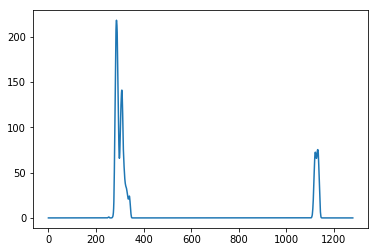

In [104]:
### Step-4 Finding the lane ###
import numpy as np
import cv2
import matplotlib.pyplot as plt
## 1) Show the histogram of the top-down view binary image
##    Locate the X-positions of the two lanes approximately as a starting step

histogram = np.sum(top_down[top_down.shape[0]//2:,:], axis=0)
plt.plot(histogram)

The approximate positions of left and right lane X-positions are:
286 1132


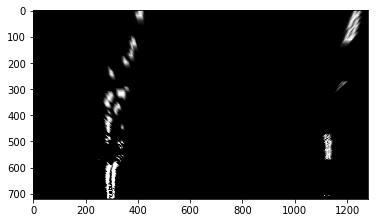

In [105]:
### out_img will be the output of the process
#opencv has to use uint8, 
#the code in the classroom 'out_img = np.dstack((top_down, top_down, top_down))*255' does not work for me
out_img = np.uint8(np.dstack((top_down, top_down, top_down))*255)
plt.imshow(out_img)
### separate the left and right lane by the mid point
midpoint = histogram.shape[0]//2
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint
print('The approximate positions of left and right lane X-positions are:')
print(leftx_base, rightx_base)


In [106]:
# Define a function windowSlide, in order to slide the window over ...
# the nonzero pixel image of binary top-down warped image

def windowSlide(nonzero_pix, size_y_window, x_current, win_current, out_img):
    ## initialize the parameters
    minpix = 50
    nonzeroy = np.array(nonzero_pix[0])
    nonzerox = np.array(nonzero_pix[1])
    size_y = size_y_window[0]
    window_height = size_y_window[1]
    margin = size_y_window[2]//2
    window = win_current
    leftx_current,rightx_current = x_current
    ## window from bottom to up
    win_y_low = size_y - (window+1)*window_height
    win_y_high = size_y - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    # For each window, there are roughly len(nonzero_pix)/n_window points of nonzero index points obtained
    # the shape of ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)...).nonzero() is (10000, )
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    #left_lane_inds.append(good_left_inds)
    #right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels (meaning "thick" lane line found ...), 
    # re-center next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    good_indx = (good_left_inds, good_right_inds)
    x_current = (leftx_current, rightx_current)

    return good_indx, x_current 



In [107]:

def multiWindowSlide(top_down, n_windows):
    out_img = np.uint8(np.dstack((top_down, top_down, top_down))*255)
    n_windows = 9
    window_height = top_down.shape[0]//n_windows
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero_pix = top_down.nonzero()
    nonzeroy = np.array(nonzero_pix[0])
    nonzerox = np.array(nonzero_pix[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows = 2* margin
    margin = 100
    # Set minimum number of pixels found to re-center window
    minpix = 50

    size_y_window = (top_down.shape[0], window_height, margin*2)
    x_current = (leftx_base, rightx_base)

    left_lane_inds = []
    right_lane_inds = []
    leftx = []
    lefty = []
    rightx = []
    righty = [] 

    for window in range(n_windows):
        good_ind_current, x_current = windowSlide(nonzero_pix, size_y_window, x_current, window, out_img)
        # Append these indices to the lists
        left_lane_inds.append(good_ind_current[0])
        right_lane_inds.append(good_ind_current[1])

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    lane_coord = (leftx, lefty, rightx, righty)
    lane_inds = (left_lane_inds, right_lane_inds)
    if len(leftx) > 0 and len(rightx) > 0:
        return lane_coord, lane_inds, out_img
    return None, lane_inds, out_img
   

In [108]:
### Visualization

### fit the x y with polynomial n =2 for each lane line
Meter_Per_Pix = (25.0/720, 3.7/850)
def polyFitLine(leftx, lefty, rightx, righty):
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    size_y = top_down.shape[0]
    ploty = np.linspace(0, size_y-1, size_y)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    return left_fitx, right_fitx
    
# Color left and right lines as red and blue respectively
def demoLane(top_down, out_img, lane_coord, lane_inds,showIMG):
    ## out_img = np.uint8(np.dstack((top_down, top_down, top_down))*255)
    nonzero_pix = top_down.nonzero()
    nonzeroy = np.array(nonzero_pix[0])
    nonzerox = np.array(nonzero_pix[1])
    size_y = top_down.shape[0]
    ploty = np.linspace(0, size_y-1, size_y)
    leftx, lefty, rightx, righty = lane_coord[0], lane_coord[1], lane_coord[2], lane_coord[3]
    left_lane_inds, right_lane_inds = lane_inds[0], lane_inds[1]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    if showIMG == True:
    ## Call the polyFitLine function to obtain two lines left_fitx right_fitx
        left_fitx, right_fitx = polyFitLine(leftx, lefty, rightx, righty)
        plt.figure(figsize=(10,5))
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    offset_bottom = Meter_Per_Pix[1]*((left_fitx[-1] + right_fitx[-1])//2 - top_down.shape[1]//2)
    print ('offset = ', offset_bottom,'m')
    return offset_bottom
def getRadius(points_x, points_y, y_eval, meter_per_pix):
    ym_per_pix, xm_per_pix = meter_per_pix[:]
    fit_real = np.polyfit(points_y * ym_per_pix, points_x * xm_per_pix, 2)
    curve_rad = ((1 + (2*fit_real[0]*y_eval*ym_per_pix + fit_real[1])**2)**1.5) / np.absolute(2*fit_real[0])
    return curve_rad    


offset =  0.300352941176 m


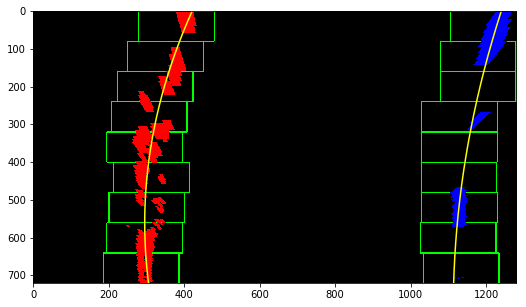

In [109]:
lane_coord, lane_inds, out_img = multiWindowSlide(top_down, 9)
offset = demoLane(top_down, out_img, lane_coord, lane_inds, True)

In [110]:

# It's now much easier to find line pixels!
# the function fast_detect relies on the result from frame prior the the current frame. 
# But of course prec-processing such as sobel/ hls filtering are still needed to generate the binary_warped

def fast_detect(binary_warped, margin, left_fit, right_fit):
    nonzero_pix = binary_warped.nonzero()
    nonzeroy = np.array(nonzero_pix[0])
    nonzerox = np.array(nonzero_pix[1])
    
    # Instead of sliding windows from bottom to top to obtain the green boxes of interest, 
    # we just need to use the fitted line as a guideline:
    # for all the nonzeroy points, calculate each point's fitted x value polyfit_L and polyfit_R
    polyfit_L = left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2]
    polyfit_R = right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2]

    # if one point of nonzerox end up being in the approximity of the fitted x value polyfit_L and polyfit_R, return true
    left_lane_inds = ((nonzerox > (polyfit_L - margin)) & (nonzerox < (polyfit_L + margin))) 
    right_lane_inds = ((nonzerox > (polyfit_R - margin)) & (nonzerox < (polyfit_R + margin)))  
    lane_inds = (left_lane_inds, right_lane_inds)
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each, this is a update for the next frame's iamge
    if len(leftx) > 0 and len(rightx) > 0:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        lane_coord = (leftx, lefty, rightx, righty)

        return lane_coord, lane_inds
    
    return None, lane_inds


def demo_fast_detect(binary_warped, lane_coord, lane_inds, showIMG):
    # Fit a second order polynomial to each, this is a update for the next frame's iamge
    leftx, lefty, rightx, righty = lane_coord[0], lane_coord[1], lane_coord[2], lane_coord[3]
    left_lane_inds, right_lane_inds = lane_inds[0], lane_inds[1]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting, same as done in previous block, but with newly updated left_fit/right_fit
    size_y = binary_warped.shape[0]
    ploty = np.linspace(0, size_y-1, size_y)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    nonzero_pix = binary_warped.nonzero()
    nonzeroy = np.array(nonzero_pix[0])
    nonzerox = np.array(nonzero_pix[1])
    
    # The last step is to visualize the inferred region 
    # Create an image to draw on and an image to show the selection window
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # The so-called polygon refers to the belt shape defined by left_fitx - margin and left_fitx + margin
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    if showIMG == True:
        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.4, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    offset_bottom = Meter_Per_Pix[1]*((left_fitx[-1] + right_fitx[-1])//2 - top_down.shape[1]//2)
    print ('offset = ', offset_bottom, 'm')
    return offset_bottom
    

offset =  0.156705882353 m


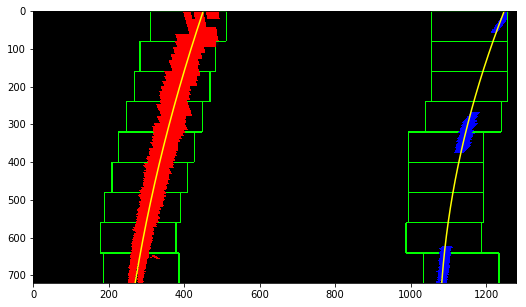

In [111]:
# The following two blocks is to demonstrate the fast detection method that use the prior frame as a starting point
# works 

image = mpimg.imread(cwd + '/test_images/test3.jpg')
# undistort image
image_undistort = cal_undistort(image, mtx_lane, dist_lane)
# Run the functions!
gradX_binary = abs_sobel_thresh(image_undistort, orient='x', thresh_min=12, thresh_max=220)
gradY_binary = abs_sobel_thresh(image_undistort, orient='y', thresh_min=12, thresh_max=220)
magnitude_binary = mag_thresh(image_undistort, sobel_kernel=9, mag_thresh=(12, 220))
dir_binary = dir_threshold(image_undistort, sobel_kernel=9, thresh=(0.7, 1.3))

S_binary = hls_select(image, channel = 's', thresh=(90, 255))

combined = np.zeros_like(dir_binary)
combined[(((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) & (dir_binary == 1))) & S_binary == 1] = 1 

binary_warped, perspective_M, M_inv = warp_binary(combined, objPoints, imgPoints, src, dst)
lane_coord, lane_inds, out_img = multiWindowSlide(binary_warped, 9)
offset = demoLane(binary_warped, out_img, lane_coord, lane_inds, True)
  

1166 m 626 m
average radius =  896 m
offset =  0.282941176471 m


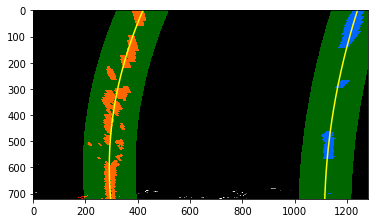

In [112]:

leftx, lefty, rightx, righty = lane_coord[0], lane_coord[1], lane_coord[2], lane_coord[3]
left_lane_inds, right_lane_inds = lane_inds[0], lane_inds[1]
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")

image = mpimg.imread(cwd + '/test_images/test4.jpg')
# undistort image
image_undistort = cal_undistort(image, mtx_lane, dist_lane)
# Run the functions!
gradX_binary = abs_sobel_thresh(image_undistort, orient='x', thresh_min=12, thresh_max=220)
gradY_binary = abs_sobel_thresh(image_undistort, orient='y', thresh_min=12, thresh_max=220)
magnitude_binary = mag_thresh(image_undistort, sobel_kernel=9, mag_thresh=(12, 220))
dir_binary = dir_threshold(image_undistort, sobel_kernel=9, thresh=(0.7, 1.3))

S_binary = hls_select(image, channel = 's', thresh=(90, 255))

combined = np.zeros_like(dir_binary)
combined[(((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) & (dir_binary == 1))) & S_binary == 1] = 1 

binary_warped, perspective_M, M_inv = warp_binary(combined, objPoints, imgPoints, src, dst)
### new frame ready for lane detection ###
##*** start from scratch method
##lane_coord, lane_inds, out_img = multiWindowSlide(binary_warped, 9)    
##leftx, lefty, rightx, righty = lane_coord[0], lane_coord[1], lane_coord[2], lane_coord[3]
##left_curverad = getRadius(leftx, lefty, Meter_Per_Pix)
##right_curverad = getRadius(rightx, righty, Meter_Per_Pix)

##*** fast method: the fast way based on the previous frame's result
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)  
margin = 100
#update the two curves and the two clusters of red and blue
lane_coord, lane_inds = fast_detect(binary_warped, margin, left_fit, right_fit)
Meter_Per_Pix = (25.0/720, 3.7/850)
y_eval = binary_warped.shape[0]
left_curverad = getRadius(leftx, lefty, y_eval, Meter_Per_Pix)
right_curverad = getRadius(rightx, righty, y_eval, Meter_Per_Pix)
print(int(left_curverad), 'm', int(right_curverad), 'm')
print('average radius = ', int((left_curverad + right_curverad)/2),'m')
offset = demo_fast_detect(binary_warped, lane_coord, lane_inds, True)


In [26]:
WIDTH_Nominal = 850
WIDTH_Margin = 0.08
# Sanity check whether a good lane is found or not
def sanity_fast(binary_warped, left_fit, right_fit, radius_left, radius_right):
    y_eval = binary_warped.shape[0]

    ploty = np.linspace(0, y_eval-1, y_eval)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # roughly parallel or not:
    delta_fitx = abs(right_fitx - left_fitx)
    parallel_check = ((np.amax(delta_fitx) - np.amin(delta_fitx)) < WIDTH_Nominal * WIDTH_Margin) 
    # abnormal spacing of the lane lines:
    #print(np.amax(delta_fitx),np.amin(delta_fitx))
    spacing_check = (np.amax(delta_fitx) < WIDTH_Nominal * (1+WIDTH_Margin)) or (np.amin(delta_fitx) > WIDTH_Nominal * (1-WIDTH_Margin))
    # check the radius
    radius_check = (max(radius_left, radius_right) < 10000) and (min(radius_left, radius_right) > 100)
    #print("parallel_check:", parallel_check,  " spacing_check:", spacing_check)
    #print("radius_check:", radius_check)
    return (parallel_check and spacing_check and radius_check)
    

In [125]:
#Following the suggestion of reviewer 
def select_yellow(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower = np.array([20,60,60])
    upper = np.array([38,174, 250])
    mask = cv2.inRange(hsv, lower, upper)

    return mask

def select_white(image):
    lower = np.array([202,202,202])
    upper = np.array([255,255,255])
    mask = cv2.inRange(image, lower, upper)

    return mask

def comb_thresh_yellow_white(image):
    #input image is RGB 
    yellow = select_yellow(image)
    white = select_white(image)

    combined_binary = np.zeros_like(yellow)
    combined_binary[(yellow >= 1) | (white >= 1)] = 1

    return combined_binary

In [151]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
def imgPipeline(image):
    Meter_Per_Pix = (25.0/720, 3.7/850)
    margin = 100
    # undistort image
    image_undistort = cal_undistort(image, mtx_lane, dist_lane)
    # Run the sobel threshold functions!
    # Run the sobel functions!
    gradX_binary = abs_sobel_thresh(image_undistort, orient='x', thresh_min=12, thresh_max=220)
    gradY_binary = abs_sobel_thresh(image_undistort, orient='y', thresh_min=12, thresh_max=220)
    magnitude_binary = mag_thresh(image_undistort, sobel_kernel=9, mag_thresh=(12, 220))
    dir_binary = dir_threshold(image_undistort, sobel_kernel=9, thresh=(0.7, 1.3))
    # HLS saturation channel
    S_binary = hls_select(image_undistort, channel = 's', thresh=(30, 255))

    # add RGB channel's red following the reviewer's suggestion
    R_binary = rgb_select(image_undistort, channel = 'r', thresh=(50, 255))
    # add LAB's B channel:
    B_lab_binary = lab_select(image_undistort, channel = 'b', thresh=(165, 255))
    L_luv_binary = luv_select(image_undistort, channel = 'l', thresh=(210, 255))
    #Following the suggestion of reviewer, adding white and yellow detection
    yellow_white = comb_thresh_yellow_white(image_undistort)
    
    combined = np.zeros_like(dir_binary)    
    combined[(yellow_white == 1) |((B_lab_binary == 1) | (L_luv_binary ==1)) ] = 1
    # perspective change
    binary_warped, perspective_M, M_inv = warp_binary(combined, objPoints, imgPoints, src, dst)
    y_eval = binary_warped.shape[0]
    
    ## From now on, processing is done on the warped (top-down view image), top_down = binary_warped 
    #if previous detection is not good, run sliding window
    if not LeftPrev.detected or not RightPrev.detected:
        lane_coord, lane_inds, out_img = multiWindowSlide(binary_warped, 9)
        leftx, lefty, rightx, righty = lane_coord[0], lane_coord[1], lane_coord[2], lane_coord[3]
        left_curverad = getRadius(leftx, lefty, y_eval, Meter_Per_Pix)
        right_curverad = getRadius(rightx, righty, y_eval, Meter_Per_Pix)
        LeftPrev.detected = True
        RightPrev.detected = True
        LeftPrev.ally = lefty
        LeftPrev.allx = leftx
        RightPrev.ally = righty
        RightPrev.allx = rightx
        #demoWarpBinary(image, binary_warped, src, dst)
        #demoLane(binary_warped, out_img, lane_coord, lane_inds, True)

    ## before calling the multi-window slide, let us try if we can find the lane based on previous frame   
    else: 
        lefty = LeftPrev.ally
        leftx = LeftPrev.allx
        righty = RightPrev.ally
        rightx = RightPrev.allx

        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        lane_coord, lane_inds = fast_detect(binary_warped, margin, left_fit, right_fit)

        ## sanity check if the fast way works
        ##update the fitting parameters if fast_detect works fine
        if lane_coord != None:
            leftx, lefty, rightx, righty = lane_coord[0], lane_coord[1], lane_coord[2], lane_coord[3]
            left_curverad = getRadius(leftx, lefty, y_eval, Meter_Per_Pix)
            right_curverad = getRadius(rightx, righty, y_eval, Meter_Per_Pix)
        
            ## sanity check
            left_fit = np.polyfit(lefty, leftx, 2)
            right_fit = np.polyfit(righty, rightx, 2)
            sanity_Check = sanity_fast(binary_warped, left_fit, right_fit, left_curverad, right_curverad)

            if sanity_Check and (len(leftx) > 10 and len(rightx) > 10):
            #update the LeftPrev and RightPrev only when sanity check is passed (it's a good frame)
                LeftPrev.detected = True
                RightPrev.detected = True
                LeftPrev.ally = lefty
                LeftPrev.allx = leftx
                RightPrev.ally = righty
                RightPrev.allx = rightx
                #demo_fast_detect(binary_warped, lane_coord, lane_inds)
            
        ### IF that previous lane line cannot give good result... 
        ### return to the multi-windowSlide ###
        else:
            lane_coord, lane_inds, out_img = multiWindowSlide(binary_warped, 9)

            if lane_coord != None:
                # a good frame found
                leftx, lefty, rightx, righty = lane_coord[0], lane_coord[1], lane_coord[2], lane_coord[3]
                left_curverad = getRadius(leftx, lefty, y_eval, Meter_Per_Pix)
                right_curverad = getRadius(rightx, righty, y_eval, Meter_Per_Pix)
                left_fit = np.polyfit(lefty, leftx, 2)
                right_fit = np.polyfit(righty, rightx, 2)
                sanity_Check = sanity_fast(binary_warped, left_fit, right_fit, left_curverad, right_curverad)
                if sanity_Check and (len(leftx) > 20 and len(rightx) > 20):
                #update the LeftPrev and RightPrev only when sanity check is passed (it's a good frame)
                    LeftPrev.detected = True
                    RightPrev.detected = True
                    LeftPrev.ally = lefty
                    LeftPrev.allx = leftx
                    RightPrev.ally = righty
                    RightPrev.allx = rightx
                else:
                    # this is still a bad frame even with sliding window process, my best guess is the previously recorded lane line
                    lefty = LeftPrev.ally
                    leftx = LeftPrev.allx
                    righty = RightPrev.ally
                    rightx = RightPrev.allx
                    left_curverad = getRadius(leftx, lefty, y_eval, Meter_Per_Pix)
                    right_curverad = getRadius(rightx, righty, y_eval, Meter_Per_Pix)

            else:
                # this is a bad frame, my best guess is the previously recorded lane line
                lefty = LeftPrev.ally
                leftx = LeftPrev.allx
                righty = RightPrev.ally
                rightx = RightPrev.allx
                left_curverad = getRadius(leftx, lefty, y_eval, Meter_Per_Pix)
                right_curverad = getRadius(rightx, righty, y_eval, Meter_Per_Pix)
    

    ## Visualize on the original image
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    ploty = np.linspace(0, y_eval-1, y_eval)
    left_fitx, right_fitx = polyFitLine(leftx, lefty, rightx, righty)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    curve_rad = int((left_curverad + right_curverad)/2)
    
    real_offset = Meter_Per_Pix[1]*((left_fitx[-1] + right_fitx[-1])//2 - binary_warped.shape[1]//2)
    if real_offset > 0 :
        side = "On Left"
    else:
        real_offset = real_offset * (-1.0)
        side = "On Right"

    result = cv2.addWeighted(image_undistort, 1, newwarp, 0.3, 0)
    text = 'Curve radius: ' + str(curve_rad) + ' m; ' + ' Offset: ' + '{:04.2f}'.format(real_offset) + ' m ' + side
    font = cv2.FONT_HERSHEY_DUPLEX

    cv2.putText(result, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    #plt.figure(figsize=(10,6))
    #plt.imshow(result)
    #print(int(left_curverad), 'm', int(right_curverad), 'm')
    #print('average radius = ', int((left_curverad + right_curverad)/2),'m')
    #print('average offset = ', Meter_Per_Pix[1]*((np.mean(leftx) + np.mean(rightx))/2 - binary_warped.shape[1]/2), 'm')



    return result



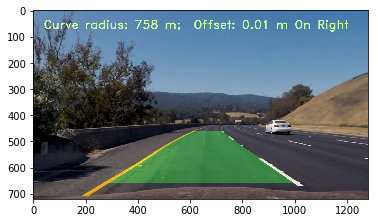

In [158]:

LeftPrev = Line()
RightPrev = Line()

#image_new = mpimg.imread(cwd + '/test_images/test5.jpg')
image_new = mpimg.imread(cwd + '/frame26.jpg')
temp = imgPipeline(image_new)
plt.imshow(temp)

offset =  0.195882352941 m


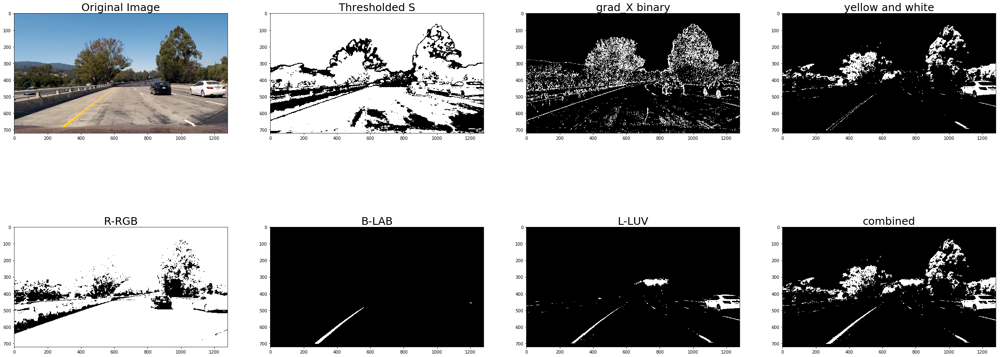

offset =  0.195882352941 m


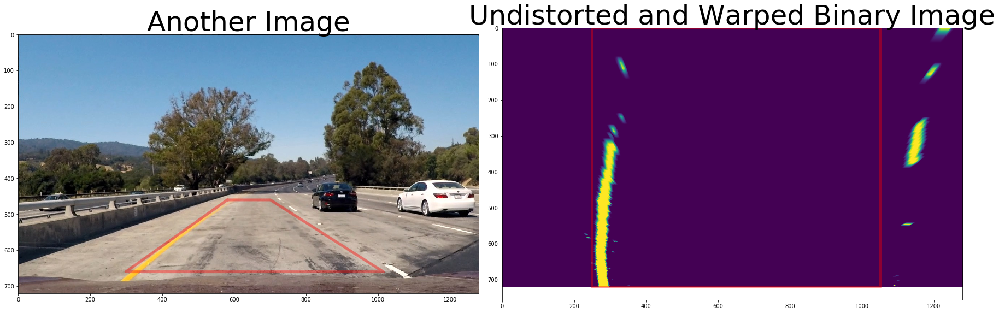

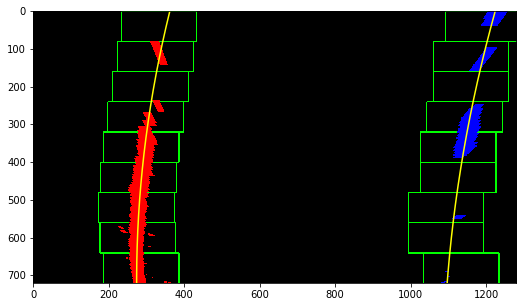

In [146]:

LeftPrev = Line()
RightPrev = Line()
image = mpimg.imread(cwd + '/frame19.jpg')
image = mpimg.imread(cwd + '/test_images/test1.jpg')

# undistort image
image_undistort = cal_undistort(image, mtx_lane, dist_lane)

# Run the sobel functions!
gradX_binary = abs_sobel_thresh(image_undistort, orient='x', thresh_min=12, thresh_max=200)
gradY_binary = abs_sobel_thresh(image_undistort, orient='y', thresh_min=12, thresh_max=200)
magnitude_binary = mag_thresh(image_undistort, sobel_kernel=9, mag_thresh=(12, 200))
dir_binary = dir_threshold(image_undistort, sobel_kernel=9, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
#combined[((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) & (dir_binary == 1))] = 1
### ** the above needs to be functionalized ** ###

S_binary = hls_select(image_undistort, channel = 's', thresh=(30, 255))

# add RGB channel's red following the reviewer's suggestion
R_binary = rgb_select(image_undistort, channel = 'r', thresh=(50, 255))
# add LAB's B channel:
B_lab_binary = lab_select(image_undistort, channel = 'b', thresh=(165, 255))
L_luv_binary = luv_select(image_undistort, channel = 'l', thresh=(210, 255))
yellow_white = comb_thresh_yellow_white(image_undistort)
#combined[(((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) 
 #           & (dir_binary == 1))) & (B_lab_binary == 1) & (R_binary == 1)] = 1 
combined[(yellow_white == 1) |((B_lab_binary == 1) | (L_luv_binary ==1)) ] = 1

top_down, perspective_M, M_rev = warp_binary(combined, objPoints, imgPoints, src, dst)
demoWarpBinary(image, top_down, src, dst)
binary_warped, perspective_M, M_inv = warp_binary(combined, objPoints, imgPoints, src, dst)
lane_coord, lane_inds, out_img = multiWindowSlide(binary_warped, 9)
offset = demoLane(binary_warped, out_img, lane_coord, lane_inds, True)
plt.close('all')
f, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(32, 16))
#f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(S_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=25)
ax3.imshow(gradX_binary, cmap='gray')
ax3.set_title('grad_X binary', fontsize=25)
ax4.imshow(yellow_white, cmap='gray')
ax4.set_title('yellow and white', fontsize=25)

ax5.imshow(R_binary, cmap='gray')
ax5.set_title('R-RGB', fontsize=25)
ax6.imshow(B_lab_binary, cmap='gray')
ax6.set_title('B-LAB', fontsize=25)
ax7.imshow(L_luv_binary, cmap='gray')
ax7.set_title('L-LUV', fontsize=25)
ax8.imshow(combined, cmap='gray')
ax8.set_title('combined', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.1)
plt.show(f)
demoWarpBinary(image, top_down, src, dst)
binary_warped, perspective_M, M_inv = warp_binary(combined, objPoints, imgPoints, src, dst)
lane_coord, lane_inds, out_img = multiWindowSlide(binary_warped, 9)
offset = demoLane(binary_warped, out_img, lane_coord, lane_inds, True)


In [ ]:
###### Read in an image, you can also try test1.jpg or test4.jpg
#image = mpimg.imread(cwd + '/test_images/test1.jpg')
image = mpimg.imread(cwd + '/frame15.jpg')
#image = mpimg.imread(cwd + '/test_images/test1.jpg')
# undistort image
image_undistort = cal_undistort(image, objPoints, imgPoints)
# Run the sobel functions!
gradX_binary = abs_sobel_thresh(image_undistort, orient='x', thresh_min=12, thresh_max=220)
gradY_binary = abs_sobel_thresh(image_undistort, orient='y', thresh_min=12, thresh_max=220)
magnitude_binary = mag_thresh(image_undistort, sobel_kernel=9, mag_thresh=(12, 220))
dir_binary = dir_threshold(image_undistort, sobel_kernel=9, thresh=(0.7, 1.3))
# HLS
S_binary = hls_select(image_undistort, channel = 's', thresh=(140, 255))

#newly added channels
R_binary = rgb_select(image_undistort, channel = 'r', thresh=(160, 255))
G_binary = rgb_select(image_undistort, channel = 'g', thresh=(160, 255))
B_lab_binary = lab_select(image_undistort, channel = 'b', thresh=(140, 255))
L_luv_binary = luv_select(image_undistort, channel = 'l', thresh=(140, 255))

combined = np.zeros_like(dir_binary)
combined[((S_binary == 1) & (B_lab_binary == 1))| ((R_binary == 1) & (G_binary == 1) & (L_luv_binary ==1))] = 1 

#(((gradX_binary == 1) & (gradY_binary == 1)) | ((magnitude_binary == 1) & (dir_binary == 1))) & 

# Plot the result
plt.close('all')
f, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(32, 12))
#f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(S_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=25)
ax3.imshow(magnitude_binary, cmap='gray')
ax3.set_title('magnitude binary', fontsize=25)
ax4.imshow(dir_binary, cmap='gray')
ax4.set_title('direction binary', fontsize=25)

ax5.imshow(R_binary, cmap='gray')
ax5.set_title('R-RGB', fontsize=25)
ax6.imshow(B_lab_binary, cmap='gray')
ax6.set_title('B-LAB', fontsize=25)
ax7.imshow(L_luv_binary, cmap='gray')
ax7.set_title('L-LUV', fontsize=25)
ax8.imshow(combined, cmap='gray')
ax8.set_title('combined', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.1)
plt.show(f)

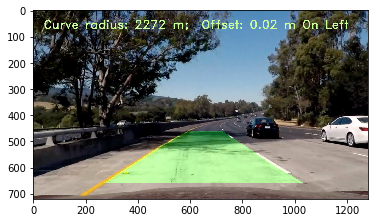

In [159]:
image_new = mpimg.imread(cwd + '/test_images/test5.jpg')
temp = imgPipeline(image_new)
plt.imshow(temp)

In [161]:
# Import everything needed to edit/save/watch video clips

#from moviepy.editor import *
from moviepy.editor import VideoFileClip
from IPython.display import HTML
white_output = 'output_video_new.mp4'
Left = Line()
Right = Line()
#clip1 = VideoFileClip("project_video.mp4").subclip(20,25)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(imgPipeline)

white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_video_new.mp4
[MoviePy] Writing video output_video_new.mp4


100%|█████████▉| 1260/1261 [25:33<00:00,  1.32it/s]    


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video_new.mp4 



In [82]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

ffmpeg_extract_subclip("project_video.mp4", t1= 23, t2=25, targetname="test.mp4")
import cv2
vidcap = cv2.VideoCapture("test.mp4")
success,image = vidcap.read()
count = 0
success = True
while success:
    success,image = vidcap.read()
    cv2.imwrite("frame%d.jpg" % count, image)     # save frame as JPEG file
    count += 1
print("number of images written: ",count)


[MoviePy] Running:
>>> /Users/austen/Library/Application Support/imageio/ffmpeg/ffmpeg.osx -y -i project_video.mp4 -ss 23.00 -t 2.00 -vcodec copy -acodec copy test.mp4
... command successful.
number of images written:  28


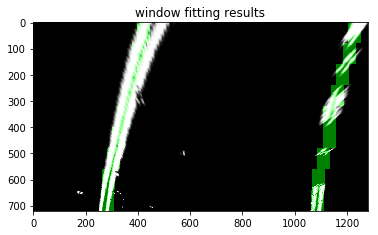

In [230]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2

# Read in a thresholded image
warped = binary_warped
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),
           max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
	    # convolve the window into the vertical slice of the image
	    image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
	    conv_signal = np.convolve(window, image_layer)
	    # Find the best left centroid by using past left center as a reference
	    # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
	    offset = window_width/2
	    l_min_index = int(max(l_center+offset-margin,0))
	    l_max_index = int(min(l_center+offset+margin,image.shape[1]))
	    l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
	    # Find the best right centroid by using past right center as a reference
	    r_min_index = int(max(r_center+offset-margin,0))
	    r_max_index = int(min(r_center+offset+margin,image.shape[1]))
	    r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
	    # Add what we found for that layer
	    window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
	    l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
	    r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
	    # Add graphic points from window mask here to total pixels found 
	    l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
	    r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage= np.uint8(np.dstack((warped, warped, warped))*255) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
    # If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()


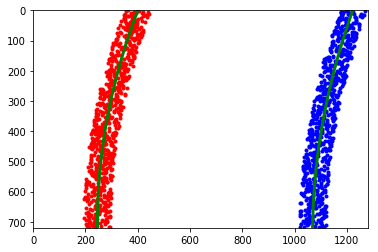

In [234]:
import numpy as np
import matplotlib.pyplot as plt
# Generate some fake data to represent lane-line pixels

#ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([244 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([1070 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images
